# Planetary Orbit

_Colin Leach, June 2018_

## Contents

- [Introduction](#Intro)
- [Keplerian Ellipse](#Kepler)
- [Newtonian Gravity](#Newton)
- [Interactive plot](#Interactive)
- [Animated plots](#Animated)

<a id='Intro'></a>    
## Introduction

A simple time-stepping simulation of a planet orbiting a massive star, or equivalently the orbit of the reduced mass about the system's center of mass.

There are multiple ways to model the orbit. One is to constrain it to a perfect ellipse and follow Kepler's laws, with constant angular momentum. Here the key result is to determine $d\theta$ at each time step, the angle swept out by the orbit.

Another approach is to start the planet with an appropriate momentum, for example at perihelion, then let the orbit evolve under Newtonian gravity. If all goes well, it will trace out an ellipse despite this being a $t=0$ boundary condition rather than an explicit constraint.

<a id='Kepler'></a>  
## Keplerian ellipse

From Kepler's first law, the distance from the principal focus is
$$r = \frac{a(1-e^2)}{1+e \cos \theta} \qquad (0 \le e < 1)$$

The angular momentum per unit mass is
$$ \frac{L}{m} = \sqrt{G M a (1-e^2)} $$
Note that this is a maximum for purely circular motion ($e = 0$) and goes to zero as the eccentricity approaches unity.

From Kepler's second law, the time rate if change of area is
$$ \frac{dA}{dt} = \frac{1}{2} r^2 \frac{d \theta}{dt} = \frac{1}{2} \frac{L}{m} \quad \Rightarrow \quad d \theta = \frac{L}{m r^2} dt $$
So we could use this $d \theta$ for our time steps. 

In the nature of numerical simulations, this relies on keeping $dt$, and hence $d \theta$, small enough (whatever "enough" turns out to be). This gives us more points than can be fitted comportably on a graphical plot, so eventually we will take every $n^{th}$ point for plotting.

<a id='Newton'></a>  
## Newtonian gravity

The velocity at any point on an elliptical orbit is
$$ v = \sqrt{G M \left( \frac{2}{r} - \frac{1}{a} \right) } $$
At perihelion we know that $r = a(1-e)$, so
$$ \vec{v}_{ph} = \sqrt{G M \left(\frac{2}{a(1-e)} - \frac{1}{a}\right)}\, \hat{v} \quad=\quad \sqrt{\frac{G M}{a} \frac{1+e}{1-e}}\, \hat{v} $$
Also, at perihelion (and aphelion) this velocity is a vector perpendicular to the star-planet vector $\vec{r}$.

At each time step the planet experiences a gravitational acceleration towards the star (in the $-\hat{r}$ direction):
$$ \vec{a} =  \dot{\vec{v}} = -\frac{G M}{r^2} \hat{r} \qquad \Rightarrow \qquad d\vec{v} =  \dot{\vec{v}}\, dt = -\frac{G M}{r^2} \hat{r}\,dt \qquad \Rightarrow \qquad d\vec{r} = \vec{v}\,dt $$
Thus we have a way to update $\vec{r}$ and $\vec{v}$ at each time step.

As a way of doing numerical integration of a differential equation, $\vec{r} = \int \vec{v}(t)\, dt$, this first-order (Euler?) method is at the crude end of the range of possibilities. It does acceptably well for a single orbit but is likely to become unstable over longer times. It's just very easy to implement compared with something like a 4th-order Runge-Kutta method that the professionals might prefer.

In [1]:
# inline vs notebook: see discussion at the bottom of this notebook
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from IPython.display import Image, HTML
from matplotlib import animation
from matplotlib.offsetbox import AnchoredText

from ipywidgets import interact, interactive, fixed, interact_manual, Layout
import ipywidgets as w

# removed display_animation to save installing a non-essentail package 
# JSAnimation is not part of the Anconda distribution by default
# from JSAnimation.IPython_display import display_animation

from astropy import units as u
from astropy.constants import G

Define the calculation so it can be called from the various types of plot:

In [2]:
def veclen(vector):
    # beware, units are lost and this just returns a number
    return np.linalg.norm(vector) 

def vecperp(vector):
    "rotate 90 deg ccw, return normalised vector in x,y plane"
    v = np.array([-vector[1], vector[0], 0])
    return v/veclen(v)

def calcOrbit(Mstar, a, e, i=0, n=2000, dt=None, phi=0):
    """Parameters: Mstar = central mass (kg)
                   a = semimajor axis (m)
                   e = eccentricity
                   i = inclination (deg)
                   n = optional number of time points to calculate 
                     (keep n at least 500 for a single orbit)
                   dt = time step (s)
                   phi = orientation of perihelion (deg ccw from x-axis) """
    
    outdict = {} # for returning results
    outdict['n'] = n
    
    # calculate expected orbital period and time step
    outdict['P'] = np.sqrt(4 * np.pi**2 * a**3/(G * Mstar))
    if dt is None:
        dt = outdict['P']/(n-1) # seconds

    # arrays to hold the results
    outdict['t_yrs'] = np.linspace(0, outdict['P'].to(u.yr), n)
    outdict['r_vecs'] = np.empty((n,3)) # x,y,z colums
    outdict['v_vecs'] = np.empty((n,3))

    # set starting values, at perihelion
    r_dir = np.array([np.cos(phi), np.sin(phi), np.sin(i)]) # assume for now that i=0
    rhat = r_dir/veclen(r_dir)
    r_vec = a*(1-e) * rhat
    outdict['r_vecs'][0, :] = r_vec
    
    vhat = vecperp(rhat) 
    v_vec = np.sqrt(G*Mstar/a*(1+e)/(1-e)) * vhat
    outdict['v_vecs'][0, :] = v_vec

    # start the main simulation loop
    for i in range(n):
        r = veclen(r_vec) * u.m # units get lost when taking the norm?
        dv = -G*Mstar/r**2 * rhat * dt
        v_vec += dv
        dr = v_vec*dt
        r_vec += dr
        rhat = r_vec.value/veclen(r_vec)
        
        # store the results
        outdict['v_vecs'][i] = v_vec.to(u.km/u.s)
        outdict['r_vecs'][i] = r_vec.to(u.AU)

    # Calculate scalar velocities and radii
    outdict['v_m_s'] = np.linalg.norm(outdict['v_vecs'], axis=1) * u.km/u.s
    outdict['r_AUs'] = np.linalg.norm(outdict['r_vecs'], axis=1) * u.AU
    outdict['theta_rads'] = (np.arctan2(outdict['r_vecs'][:,1], outdict['r_vecs'][:,0])*u.rad)
    
    # angles -180 < theta < 180 will mess up our later plot, so convert to 0 < theta < 360
    outdict['theta_rads'][ outdict['theta_rads'] < 0 ] += 2*np.pi*u.rad 

    return outdict
    

How good is the simulation? One way to test it is to calculate several orbits and see if they coincide or drift apart with time. 

The code for this is in the cells below. A bit of testing suggests that the results look pretty tight out to 10 orbits, but a highly elliptical orbit will precess visibly over 100 orbits. Even that took a few minutes to calculate, so playing with higher values of `nOrbits` is something to set running then walk away from.

As expected, accuracy is sensitive to step size. Halving `n_per_orbit` to 1000 produces quite poor results over 100 orbits.

In [3]:
nOrbits = 5
# nOrbits = 100

Mstar = (1*u.M_sun).to(u.kg)
a = (1*u.AU).to(u.m)
e = 0.8 # highly elliptical orbits probably have worse errors
P = np.sqrt(4 * np.pi**2 * a**3/(G * Mstar))
n_per_orbit = 2000
dt = P/n_per_orbit
n_total = n_per_orbit*nOrbits

data = calcOrbit(Mstar, a, e, n=n_total, dt=dt)

A simple plot of the multiple orbits:

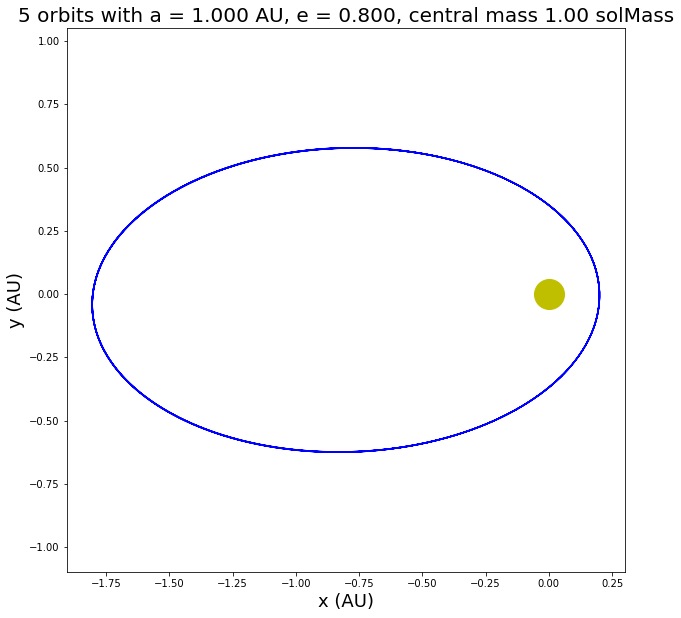

In [4]:
figwidth = 10
fig = plt.figure(figsize=(figwidth, figwidth))
#     fig, ax = plt.subplots(figsize=(figwidth, figwidth))
plt.plot(data['r_vecs'][:,0], data['r_vecs'][:,1], 'b-')
plt.axis('equal')
plt.plot(0,0,'yo',markersize=30)
plt.xlabel('x (AU)', fontsize=18)
plt.ylabel('y (AU)', fontsize=18)
plt.title('{3} orbits with a = {0:.3f}, e = {1:.3f}, central mass {2:.2f}'
          .format(a.to(u.AU), e, Mstar.to(u.Msun), nOrbits), fontsize=20);

***

<a id='Interactive'></a>  
## Interactive Plot

Jupyter/Python notebooks support many types of interactivity via `ipywidgets`. These link to a function, in this case `plotOrbit()`, to update the display however the programmer chooses.

First define the plot, within a function so it can be called interactively:

In [5]:
def plotOrbit(Mstar, a, ecc):
    # convert the parameters into the right units
    Mstar_kg = (Mstar * u.M_sun).to(u.kg)
    a_m = (a * u.AU).to(u.m)
    
    # run the calculation
    orbitData = calcOrbit(Mstar_kg, a_m, ecc)
    
    # set some useful values for plotting and annotation
    stepcount = 10 # plot every 10th time step
    steptime = (orbitData['P']/orbitData['n']*stepcount).to(u.day)
    perihelion = a*(1-ecc)*u.AU
    aphelion = a*(1+ecc)*u.AU
    
    # make the plot
    plt.ioff
    figwidth = 10
#     fig = plt.figure(figsize=(figwidth, figwidth))
    fig, ax = plt.subplots(figsize=(figwidth, figwidth))
    plt.axis('equal')
    plt.plot(0,0,'ro',markersize=30)
    plt.plot(orbitData['r_vecs'][:,0][::stepcount], orbitData['r_vecs'][:,1][::stepcount], 'b*')
    plt.xlabel('x (AU)', fontsize=18)
    plt.ylabel('y (AU)', fontsize=18)
    plt.title('Orbit with a = {0:.3f}, e = {1:.3f}, central mass {2:.2f}'
              .format(a_m.to(u.AU), ecc, Mstar_kg.to(u.Msun)), fontsize=20);
#     ax.annotate("Period {0:.4f}\nStep time {1:.3f}\nPerihelion {2:.3f}\nAphelion {3:.3f}"
#                     .format(orbitData['P'].to(u.year), steptime, perihelion, aphelion),
#                 xy=(.025, .975), xycoords='axes fraction',
#                 horizontalalignment='left', verticalalignment='top',
#                 fontsize=16)
    at = AnchoredText("Period {0:.4f}\nStep time {1:.3f}\nPerihelion {2:.3f}\nAphelion {3:.3f}"
                        .format(orbitData['P'].to(u.year), steptime, perihelion, aphelion),
                      prop=dict(size=12), frameon=True,
                      loc=2,
                      )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
    ax.add_artist(at)

Set up the slider controls for interaction with the plot. Continuous update probably needs to be turned off, so the plot will redraw once you release the slider (mouse button up).

In [6]:
style = {'description_width': 'initial'} # to avoid the labels getting truncated
interact(plotOrbit, 
             Mstar = w.FloatSlider(description="Central Mass (M_sun)", style=style,
                                            layout=Layout(width='80%'),
                                            continuous_update=False, # otherwise flicker is horrible
                                            min=0.3, max=20, 
                                            value=1.0), 
             a = w.FloatSlider(description="Semimajor axis (AU)", style=style,
                                            layout=Layout(width='80%'),
                                            continuous_update=False,
                                            min=0.1, max=100, 
                                            value=1.0),
             ecc = w.FloatSlider(description="Eccentricity", style=style,
                                            layout=Layout(width='80%'),
                                            continuous_update=False, 
                                            min=0.0, max=0.99, step=0.01,
                                            value=0.1));


interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='Central Mass (M_sun)', layo…

***

<a id='Animated'></a>  
## Animated Plots

Making the planet move around the plot requires a different approach. Matplotlib has included animation support since about v2.1. This is great, but it doesn't combine well with the interactivity shown in the previous section: the setup is somewhat different, and pre-rendering the movie before it displays is too slow for rapid interaction.

Therefore, everything below is disconnected from the orbit parameter sliders. Edit the Python code in the next cell to set the values to model.

First calculate some data:

In [7]:
#*******************************************************
#
#  This is where to set values for the orbit animation
#
#*******************************************************
Mstar = 1    # M_sol
a = 1        # AU
ecc = 0.6    # more visual than a circular orbit !

Next generate orbit data:

In [8]:
# convert the parameters into the right units
Mstar_kg = (Mstar * u.M_sun).to(u.kg)
a_m = (a * u.AU).to(u.m)

# run the calculation, returning a dictionary of data
orbit_data = calcOrbit(Mstar_kg, a_m, ecc)

*Set up some animation parameters and a skeleton plot which **should not*** yet display. If it does, that's a bug - see discussion of Issues at the end of this notebook.

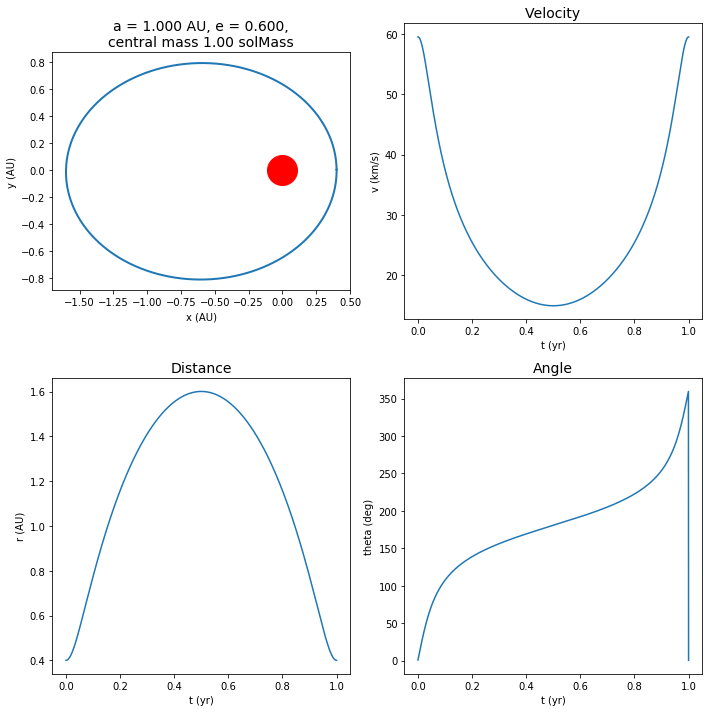

In [9]:
Nframes = 100
# get subset of x,y arrays for Nframes planet positions for animation
data_ratio = orbit_data['r_vecs'][:,0].size // Nframes
x_planet = orbit_data['r_vecs'][:,0][::data_ratio]
y_planet = orbit_data['r_vecs'][:,1][::data_ratio]

t_full = orbit_data['t_yrs']
v_full = orbit_data['v_m_s']
r_full = orbit_data['r_AUs']
theta_full = orbit_data['theta_rads'].to(u.deg)
t_planet = t_full[::data_ratio]
v_planet = v_full[::data_ratio]
r_planet = r_full[::data_ratio]
theta_planet = theta_full[::data_ratio]

# Now set up the figure, the axis, and the plot element we want to animate
plt.ioff()
figwidth = 10
fig_anim = plt.figure(figsize=(figwidth, figwidth))

# add the main orbit plot
# ax = plt.subplot2grid((4,4), (0,0), colspan=2, rowspan=2, aspect='equal')
axo = plt.subplot2grid((2,2), (0,0), aspect='equal')

axo.plot(0,0,'ro',markersize=30) # the star
axo.plot(orbit_data['r_vecs'][:,0], orbit_data['r_vecs'][:,1], lw=2)
axo.set_xlabel('x (AU)') #, fontsize=18)
axo.set_ylabel('y (AU)') #, fontsize=18)
axo.set_title('a = {0:.3f}, e = {1:.3f},\ncentral mass {2:.2f}'
          .format(a_m.to(u.AU), ecc, Mstar_kg.to(u.Msun)), fontsize=14)
planet, = axo.plot([], [], 'go', ms=15)

# removed main title, it overlaps graphs messily
# plt.suptitle('Orbit with a = {0:.3f}, e = {1:.3f}, central mass {2:.2f}'
#           .format(a_m.to(u.AU), ecc, Mstar_kg.to(u.Msun)), fontsize=18);

# add the velocity-time plot
# axv = plt.subplot2grid((4,4), (0,2), colspan=2, rowspan=2)
axv = plt.subplot2grid((2,2), (0,1))
axv.plot(t_full, v_full)
axv.set_xlabel('t (yr)') 
axv.set_ylabel('v (km/s)') 
axv.set_title('Velocity', fontsize=14)             
planetv, = axv.plot([], [], 'go', ms=10);

# add the r-t plot
axr = plt.subplot2grid((2,2), (1,0))
axr.plot(t_full, r_full)
axr.set_xlabel('t (yr)') 
axr.set_ylabel('r (AU)') 
axr.set_title('Distance', fontsize=14)             
planetr, = axr.plot([], [], 'go', ms=10);


# add the theta-t plot
axth = plt.subplot2grid((2,2), (1,1))
axth.plot(t_full, theta_full)
axth.set_xlabel('t (yr)') #, fontsize=18)
axth.set_ylabel('theta (deg)') #, fontsize=18)
axth.set_title('Angle', fontsize=14)             
planetth, = axth.plot([], [], 'go', ms=10);

plt.tight_layout()  # to stop the plots overlapping

Define the two functions needed by the animation. `init()` sets blank data for the planet,` animate(i)` sets data for step i. 

Passing parameters is messy, so for simplicity make sure all the variables you need to access are in the top-level scope.

In [10]:
def init():
    planet.set_data([], [])
    planetv.set_data([], [])
    planetr.set_data([], [])
    planetth.set_data([], [])
    return (planet, planetv, planetr, planetth)

def animate(i):
    # called for each frame
    # this is a really bad place to put anything compute-intensive
    x = x_planet[i]
    y = y_planet[i]
    planet.set_data(x, y)
    
    xv = t_planet[i]
    yv = v_planet[i]
    planetv.set_data(xv, yv)
    
    xr = t_planet[i]
    yr = r_planet[i]
    planetr.set_data(xr, yr)
    
    xth = t_planet[i]
    yth = theta_planet[i]
    planetth.set_data(xth, yth)
    
    return (planet, planetv, planetr, planetth)

Define the animation object. It doesn't do much until you pass it to a renderer.

In [11]:
anim = animation.FuncAnimation(fig_anim, animate, init_func=init,
                               frames=Nframes, interval=50, blit=True)

Now do the slow bit, rendering all the frames in a format the browser can display. Here we use `to_jshtml()`; another option is `to_html5_video()` to get h264 video. 

The `display_animation()` syntax is something that turns up in Google searches but it is probably now obsolete (since this functionality was incorporated in Matplotlib). It seems to do pretty much the same as `to_jshtml()`, but requires a non-standard package to be installed.

Click the play button and away you go. The + and - buttons are for speed control. The Reflect option is what astronomers might call "unphysical", but it's not obvious how to hide it.

In [12]:
HTML(anim.to_jshtml())
# display_animation(anim)

***

<a id='Issues'></a>  
## Issues

In separate notebooks, the interactive plot worked best with
`%matplotlib inline`
and the animated plot with
`%matplotlib notebook`

Since combining them in one notebook, there is some conflict. The interactive plot really needs `%matplotlib inline`, but then the animation setup (sometimes? always?) creates an unwanted static plot immediately, in addition to the movie created by a later cell. From discussions on Stackoverflow it's clear others have had related problems, but the fix is currently elusive.

Generating the movie is quite slow (i7 processor, single-threaded). Could parallel processing help in some way?